>>>>>> # ***DLSIR ( Bidirectional Sequence Model )***
> ### Dataset size = 32k
> ### Word Embedding = FastText
> ### CNN base stack = InceptionNet
> ### Batch Size = 16









In [0]:
from __future__ import absolute_import, division, print_function

In [2]:
import tensorflow as tf

tf.enable_eager_execution()
tf.__version__

'1.13.1'

In [3]:
from tensorflow.keras.layers import Bidirectional,CuDNNGRU,CuDNNLSTM,GRU,LSTM,concatenate,Dense,Input,Embedding
from tensorflow.keras.layers import  multiply, Flatten
from tensorflow.keras.layers import Lambda, Masking
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from hyperopt import Trials, STATUS_OK, tpe,  fmin, tpe, hp, STATUS_OK, Trials
import importlib
from keras import backend as K

Using TensorFlow backend.


In [4]:
!pip install h5py

!apt-get install -y libhdf5-dev

!pip install fasttext


Reading package lists... Done
Building dependency tree       
Reading state information... Done
libhdf5-dev is already the newest version (1.10.0-patch1+docs-4).
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 6 not upgraded.
    100% |████████████████████████████████| 81kB 15.6MB/s 
  Stored in directory: /root/.cache/pip/wheels/73/8e/5d/ecb50b90adaab5868ae1d8df180f31e55e85c2f055aaf2fb35
Successfully built fasttext


In [5]:
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse
from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass
!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}
!mkdir -p drive
!google-drive-ocamlfuse drive

E: Package 'python-software-properties' has no installation candidate
Selecting previously unselected package google-drive-ocamlfuse.
(Reading database ... 131304 files and directories currently installed.)
Preparing to unpack .../google-drive-ocamlfuse_0.7.3-0ubuntu3~ubuntu18.04.1_amd64.deb ...
Unpacking google-drive-ocamlfuse (0.7.3-0ubuntu3~ubuntu18.04.1) ...
Setting up google-drive-ocamlfuse (0.7.3-0ubuntu3~ubuntu18.04.1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&approval_prompt=force
··········
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=ht

In [6]:
import json
import fasttext
import numpy as np
import pandas as pd
import tensorflow_hub as hub
import tensorflow.keras.layers as layers
from tensorflow.keras.datasets import imdb
from gensim.models import Word2Vec
from gensim.models import FastText
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import accuracy_score,classification_report

W0425 18:38:56.807030 140087363471232 __init__.py:56] Some hub symbols are not available because TensorFlow version is less than 1.14
/usr/local/lib/python3.6/dist-packages/smart_open/ssh.py:34: UserWarning: paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress
  warnings.warn('paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress')


In [0]:
import h5py

In [0]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Scikit-learn includes many helpful utilities
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import re
import numpy as np
import os
import time
import json
from glob import glob
from PIL import Image
import pickle

## Download and prepare the MS-COCO dataset

In [0]:
annotation_zip = tf.keras.utils.get_file('captions.zip', 
                                          cache_subdir=os.path.abspath('.'),
                                          origin = 'http://images.cocodataset.org/annotations/annotations_trainval2014.zip',
                                          extract = True)
annotation_file = os.path.dirname(annotation_zip)+'/annotations/captions_train2014.json'

name_of_zip = 'train2014.zip'
if not os.path.exists(os.path.abspath('.') + '/' + name_of_zip):
  image_zip = tf.keras.utils.get_file(name_of_zip, 
                                      cache_subdir=os.path.abspath('.'),
                                      origin = 'http://images.cocodataset.org/zips/train2014.zip',
                                      extract = True)
  PATH = os.path.dirname(image_zip)+'/train2014/'
else:
  PATH = os.path.abspath('.')+'/train2014/'

13510574080/13510573713 [==============================] - 373s 0us/step


**Utility functions**

---

---

# Prepare the Embeddings using word vector models


In [0]:

params_set = {
    "embed_dim":300,
    "split_ratio":0.33,
    "max_len":200,
    "vocab_size":10000,
    "trainable_param":"False",
    "option":2,
    "workers":3,
    "window":1

}

model_params = {
    "epochs":10,
    "batch_size":1024,
    "loss":"binary_crossentropy",
    "optimizer":"adam",
    "metrics":["accuracy"]

}


def json_to_dict(json_set):
    for k,v in json_set.items():
        if v == "True":
            json_set[k]= True
        elif v == "False":
            json_set[k]=False
        else:
            json_set[k]=v
    return json_set

  
  


def load_data(vocab_size,max_len):
    """
        Loads the keras imdb dataset
        Args:
            vocab_size = {int} the size of the vocabulary
            max_len = {int} the maximum length of input considered for padding
        Returns:
            X_train = tokenized train data
            X_test = tokenized test data
    """
    INDEX_FROM = 3

    (X_train,y_train),(X_test,y_test) = imdb.load_data(num_words = vocab_size,index_from = INDEX_FROM)

    return X_train,X_test,y_train,y_test


def prepare_data_for_word_vectors_imdb(X_train):
    """
        Prepares the input
        Args:
            X_train = tokenized train data
        Returns:
            sentences = {list} sentences containing words as tokens
            word_index = {dict} word and its indexes in whole of imdb corpus
    """
    INDEX_FROM = 3
    word_to_index = imdb.get_word_index()
    word_to_index = {k:(v+INDEX_FROM) for k,v in word_to_index.items()}

    word_to_index["<START>"] =1
    word_to_index["<UNK>"]=2

    index_to_word = {v:k for k,v in word_to_index.items()}

    sentences = []
    for i in range(len(X_train)):
        temp = [index_to_word[ids] for ids in X_train[i]]
        sentences.append(temp)
    """
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(sentences)
    word_indexes = tokenizer.word_index
    """
    return sentences,word_to_index


def prepare_data_for_word_vectors(X):
    sentences_as_words=[]
    word_to_index={}
    count=1
    for sent in X:
        temp = sent.split()
        sentences_as_words.append(temp)
    for sent in sentences_as_words:
        for word in sent:
            if word_to_index.get(word,None) is None:
                word_to_index[word] = count
                count +=1
    index_to_word = {v:k for k,v in word_to_index.items()}
    sentences=[]
    for i in range(len(sentences_as_words)):
        temp = [word_to_index[w] for w in sentences_as_words[i]]
        sentences.append(temp)


    return sentences_as_words,sentences,word_to_index

def data_prep_ELMo(train_x,train_y,test_x,test_y,max_len):

    INDEX_FROM = 3
    word_to_index = imdb.get_word_index()
    word_to_index = {k:(v+INDEX_FROM) for k,v in word_to_index.items()}

    word_to_index["<START>"] =1
    word_to_index["<UNK>"]=2

    index_to_word = {v:k for k,v in word_to_index.items()}

    sentences=[]
    for i in range(len(train_x)):
        temp = [index_to_word[ids] for ids in train_x[i]]
        sentences.append(temp)

    test_sentences=[]
    for i in range(len(test_x)):
        temp = [index_to_word[ids] for ids in test_x[i]]
        test_sentences.append(temp)

    train_text = [' '.join(sentences[i][:max_len]) for i in range(len(sentences))]
    train_text = np.array(train_text, dtype=object)[:, np.newaxis]
    train_label = train_y.tolist()

    test_text = [' '.join(test_sentences[i][:500]) for i in range(len(test_sentences))]
    test_text = np.array(test_text , dtype=object)[:, np.newaxis]
    test_label = test_y.tolist()

    return train_text,train_label,test_text,test_label


def building_word_vector_model(option,sentences,embed_dim,workers,window,y_train):
    """
        Builds the word vector
        Args:
            type = {bool} 0 for Word2vec. 1 for gensim Fastext. 2 for Fasttext 2018.
            sentences = {list} list of tokenized words
            embed_dim = {int} embedding dimension of the word vectors
            workers = {int} no. of worker threads to train the model (faster training with multicore machines)
            window = {int} max distance between current and predicted word
            y_train = y_train
        Returns:
            model = Word2vec/Gensim fastText/ Fastext_2018 model trained on the training corpus
    """
    if option == 0:
        print("Training a word2vec model")
        model = Word2Vec(sentences=sentences, size = embed_dim, workers = workers, window = window)
        print("Training complete")

    elif option == 1:
        print("Training a Gensim FastText model")
        model = FastText(sentences=sentences, size = embed_dim, workers = workers, window = window)
        print("Training complete")

    elif option == 2:
        print("Training a Fasttext model from Facebook Research")
        y_train = ["__label__positive" if i==1 else "__label__negative" for i in y_train]

        with open("imdb_train.txt","w") as text_file:
            for i in range(len(sentences)):
                print(sentences[i],y_train[i],file = text_file)

        model = fasttext.skipgram("imdb_train.txt","model_ft_2018_imdb",dim = embed_dim)
        print("Training complete")

    return model

def padding_input(X_train,X_test,maxlen):
    """
        Pads the input upto considered max length
        Args:
            X_train = tokenized train data
            X_test = tokenized test data
        Returns:
            X_train_pad = padded tokenized train data
            X_test_pad = padded tokenized test data
    """

    X_train_pad = pad_sequences(X_train,maxlen=maxlen,padding="post")

    X_test_pad = pad_sequences(X_test,maxlen=maxlen,padding="post")

    return X_train_pad,X_test_pad


def ELMoEmbedding(x):
    elmo_model = hub.Module("https://tfhub.dev/google/elmo/1", trainable=True)
    return elmo_model(tf.squeeze(tf.cast(x, tf.string)), signature="default", as_dict=True)["default"]

def prepare_embedding_matrix(model_wv, tokenizer_dict):
  '''
    takes the word vector model and the vocabulary and build an embedding matrix
  '''
  embedding_matrix = [0] * len(tokenizer_dict)
  for word, index in tokenizer_dict.items():
    embedding_matrix[index] = model_wv[word]
  
  return embedding_matrix

# Building the embedding model

In [0]:

import json
import numpy as np
from sklearn.model_selection import train_test_split
padding_input,prepare_data_for_word_vectors_imdb,ELMoEmbedding,data_prep_ELMo


def json_to_dict(json_set):
    for k,v in json_set.items():
        if v == "True":
            json_set[k]= True
        elif v == "False":
            json_set[k]=False
        else:
            json_set[k]=v
    return json_set

model_config = {
    "epochs":10,
    "batch_size":1024,
    "loss":"binary_crossentropy",
    "optimizer":"adam",
    "metrics":["accuracy"]
}

params_set = {
    "embed_dim":300,
    "split_ratio":0.33,
    "max_len":200,
    "vocab_size":10000,
    "trainable_param":"False",
    "option":2,
    "workers":3,
    "window":1

}

'''
    X = text data column
    y = label column(0,1 etc)

'''
if params_set["option"]in [0,1,2]:
    
    # for other data:
    
    X = ["this is a sentence","this is another sentence by me","yet another sentence for training","one more again"]
    y=np.array([0,1,1,0])

    sentences_as_words,sentences,word_ix = prepare_data_for_word_vectors(X)
    print("sentences loaded")
    model_wv = building_word_vector_model(params_set["option"],sentences,params_set["embed_dim"],
                                       params_set["workers"],params_set["window"],y)


    print("word vector model built")
    x_train, x_test, y_train, y_test = train_test_split(sentences, y, test_size=params_set["split_ratio"], random_state=42)
    print("Data split done")
    
    x_train_pad,x_test_pad = padding_input(x_train,x_test,params_set["max_len"])
    #test if the embedding model loaded properly
    print(model_wv['book'])
  

else:
    x_train,x_test,y_train,y_test = load_data(params_set["vocab_size"],params_set["max_len"])

    train_text,train_label,test_text,test_label = data_prep_ELMo(x_train,y_train,x_test,y_test,params_set["max_len"])


sentences loaded
Training a Fasttext model from Facebook Research
Training complete
word vector model built
Data split done
[-0.0007892233552411199, 0.0007709571509622037, -0.0011394474422559142, -6.149883847683668e-05, -0.0004190277250017971, -0.00015407467435579747, 0.000739998125936836, -0.0009557089651934803, 0.0006610866985283792, 0.0001075418695108965, 0.00020191243675071746, -0.0006058664876036346, 8.142238948494196e-05, 0.0011675929417833686, -0.00044347657239995897, 0.0002213664847658947, 0.0007722352747805417, -0.0006468711653724313, -0.00022746443573851138, 0.0006329210009425879, 0.0006958863814361393, 0.0006503764889203012, -0.0004064161912538111, 0.000579734449274838, -0.0005881009274162352, -0.00016029154357966036, 1.3961725016997661e-05, -0.0003986213414464146, 0.001101066591218114, -0.0010581912938505411, -0.0005327753024175763, 0.0007579241646453738, 4.94138794238097e-06, -0.0005471291369758546, -0.00047595417709089816, 0.00021494911925401539, -0.00045667984522879124, 

## Optionally, limit the size of the training set for faster training

In [0]:
# read the json file
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

# storing the captions and the image name in vectors
all_captions = []# only has the captions
all_img_name_vector = []# only has the paths

for annot in annotations['annotations']:
    #have to see if each image has 1:5 relation with the captions and have to incorporate that somehow!
    caption = '<start> ' + annot['caption'] + ' <end>'
    image_id = annot['image_id']
    full_coco_image_path = PATH + 'COCO_train2014_' + '%012d.jpg' % (image_id)
    
    all_img_name_vector.append(full_coco_image_path)
    all_captions.append(caption)

# shuffling the captions and image_names together
# setting a random state
train_captions, img_name_vector = shuffle(all_captions,
                                          all_img_name_vector,
                                          random_state=1)

# # selecting the first 10000 captions from the shuffled set
# num_examples = 50000
# train_captions = train_captions[:num_examples]
# img_name_vector = img_name_vector[:num_examples]

In [0]:
# len(train_captions)

**DELETE STUFF NOT NEEDED!**

In [0]:
# del all_captions
# del all_img_name_vector
# del annotations

## Preprocess the images using InceptionV3

In [0]:
def load_image_inception(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path
  
def load_image_resnet(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    img = tf.keras.applications.resnet50.preprocess_input(img)
    return img, image_path

## Initialize InceptionV3/Resnet and load the pretrained Imagenet weights

In [0]:

def initialize_inception_model():
  image_model = tf.keras.applications.InceptionV3(include_top=False, 
                                                weights='imagenet')
  new_input = image_model.input
  hidden_layer = image_model.layers[-1].output

  image_features_extract_model = tf.keras.Model(new_input, hidden_layer)
  return image_features_extract_model

def initialize_resnet_model():
  image_model = tf.keras.applications.resnet50.ResNet50(include_top=False, 
                                                weights='imagenet')
  new_input = image_model.input
  hidden_layer = image_model.layers[-1].output

  image_features_extract_model = tf.keras.Model(new_input, hidden_layer)
  return image_features_extract_model

image_features_extract_model = initialize_inception_model()

In [0]:
# image_features_extract_model.summary()

**Code to cache the inceptionV3/resnet
tensors**

---



In [0]:
img_name_train = np.load('drive/MS_COCO/img_name_train.npy')
img_name_test = np.load('drive/MS_COCO/img_name_test.npy')
cap_train = np.load('drive/MS_COCO/cap_train.npy')
cap_test = np.load('drive/MS_COCO/cap_test.npy')

**DELETE STUFF NOT NEEDED!**

In [0]:
# del encode_train
# del image_dataset

## Preprocess and tokenize the captions

In [0]:
# This will find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [0]:
# The steps above is a general process of dealing with text processing
# choosing the top 5000 words from the vocabulary
top_k = 18000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k, 
                                                  oov_token="<unk>", 
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')
tokenizer.word_index['<pad>'] = 0

In [0]:
# calculating the max_length 
# used to store the attention weights
max_length = calc_max_length(train_seqs)
max_length

52

In [0]:
# prepare the embedding matrix
embedding_matrix = prepare_embedding_matrix(model_wv,tokenizer.word_index)

## Split the data into training and testing

In [0]:
# # Create training and validation sets using 80-20 split
# seed = 258
# img_name_train, img_name_test, cap_train, cap_test = train_test_split(img_name_vector, 
#                                                                     cap_vector, 
#                                                                     test_size=0.2, 
#                                                                     random_state=1)
# img_name_test,img_name_val,cap_test,cap_val = train_test_split(img_name_testval,cap_testval,test_size = 0.5,random_state = 0)

In [0]:
ls drive/

^C


**DELETE STUFF NOT NEEDED!**

In [0]:
# del img_name_vector
# del cap_vector
# del train_seqs


**MODEL HYPERPARAMETERS AND CONFIG PARAMS**

In [0]:
# feel free to change these parameters according to your system's configuration

BATCH_SIZE = 32
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
vocab_size = len(tokenizer.word_index)
# shape of the vector extracted from InceptionV3 is (64, 2048)
# these two variables represent that
features_shape = 2048
attention_features_shape = 64

model_config = {
    'dim_cnn': 4096,
    'optimizer': 'adam',
    'batch_size': BATCH_SIZE,
    'epochs': 20,
    'output_dim': 1024,
    'dim_word': 300,
    'lrate': 0.05,
    #'lrate': 0.0005,
    'max_cap_length' : max_length,
    'margin': 0.05,
    #for resnet50 the shape is 100,2048
    'image_input_shape':(64,features_shape)
}

In [0]:

img_name_train = img_name_train[:200000]
cap_train = cap_train[:200000]

img_name_train= img_name_train[:len(img_name_train)-(len(img_name_train) % BATCH_SIZE)]
cap_train= cap_train[:len(cap_train)-(len(cap_train) % BATCH_SIZE)]
len(cap_train)

200000

In [0]:
'''experimental stuff!!'''
'''
https://github.com/tensorflow/tensorflow/issues/25731
https://github.com/tensorflow/tensorflow/issues/25808
'''


# getting the unique images
encode_train = sorted(set(img_name_train))

# feel free to change the batch_size according to your system configuration
# a generator which yields 16 images at one shot along with its path
image_dataset = tf.data.Dataset.from_tensor_slices(
                                encode_train).map(load_image_inception).batch(16)

for img, path in image_dataset:
  #image_features_extract_model is the InceptionV3/Resnet stack which gives out tensors in the end 
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features, 
                              (batch_features.shape[0], -1, batch_features.shape[3]))
  

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())
  


**CREATING THE DATASET GENERATOR USING tf.data.Dataset**

In [0]:
# loading the numpy files 
def map_func(cap,img_name):
  #caching the features stored in the .npy files
  image_tensor = np.load(img_name.numpy().decode('utf-8') +'.npy')
  return cap.numpy(), image_tensor

#old code for non caching of features
#   batch_features = image_features_extract_model(tf.expand_dims(load_image(img_name)[0], axis = 0))
#   image_tensor = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))
#   image_tensor = tf.squeeze(image_tensor)

  
          

In [0]:
#create a simple datagenerator using the coco image features and the captions
def create_data_generator(cap, img_name):
  dataset = tf.data.Dataset.from_tensor_slices((cap,img_name))

  # using map to load the numpy files in parallel
  # NOTE: Be sure to set num_parallel_calls to the number of CPU cores you have
  # https://www.tensorflow.org/api_docs/python/tf/py_func
  dataset = dataset.map(lambda item1, item2: tf.py_function(
            map_func, [item1, item2], [tf.int32, tf.float32]), num_parallel_calls=8)

  # shuffling and batching
  dataset = dataset.shuffle(BUFFER_SIZE)
  # https://www.tensorflow.org/api_docs/python/tf/contrib/data/batch_and_drop_remainder
  dataset = dataset.batch(BATCH_SIZE)
  dataset = dataset.repeat()
  dataset = dataset.prefetch(1)

  return dataset
  
  

In [0]:
#using the above data_generator to yield training data to be fitted to the model at training time
def train_generator():
  train_iter = create_data_generator(cap_train, img_name_train).make_one_shot_iterator()
  while True:
    caps, imgs = train_iter.get_next()
    batch = [caps.numpy(),imgs.numpy()]
    dummy = np.zeros(shape=(BATCH_SIZE, model_config['output_dim'] * 2))    
    yield batch, dummy
    

def test_generator():
  test_iter = create_data_generator(cap_test, img_name_test).make_one_shot_iterator()
  while True:
    caps, imgs = test_iter.get_next()
    batch = [caps.numpy(),imgs.numpy()]
#     dummy = np.zeros(shape=(BATCH_SIZE, model_config['output_dim'] * 2))    
    yield batch
  
  
# def val_generator():
#   val_iter = create_data_generator(cap_val, img_name_val).make_one_shot_iterator()
#   while True:
#     caps, imgs = val_iter.get_next()
#     batch = [caps.numpy(),imgs.numpy()]
#     dummy = np.zeros(shape=(BATCH_SIZE, model_config['output_dim'] * 2))    
#     yield batch, dummy


##Model

In [0]:
#A GRU WRAPPER
def gru(units):

  if tf.test.is_gpu_available():
    return CuDNNGRU(units, 
                    return_sequences=False, 
                    return_state=False, 
                    recurrent_initializer='glorot_uniform')
  else:
    return GRU(units, 
                 return_sequences=False, 
                 return_state=False, 
                 recurrent_activation='sigmoid', 
                 recurrent_initializer='glorot_uniform')
  
  
def lstm(units):  
  if tf.test.is_gpu_available():
    return CuDNNLSTM(units, 
                    return_sequences=False, 
                    return_state=True, 
                    recurrent_initializer='glorot_uniform')
  else:
    return LSTM(units, 
                 return_sequences=False, 
                 return_state=True, 
                 recurrent_activation='sigmoid', 
                 recurrent_initializer='glorot_uniform')
  

#RELATED TO LOSS FUNCTIONS
def compute_errors(s_emb, im_emb):
    """ Given sentence and image embeddings, compute the error matrix """
    errors = [order_violations(x, y) for x in s_emb for y in im_emb]
    return np.asarray(errors).reshape((len(s_emb), len(im_emb)))

def order_violations(s, im):
    """ 
    Computes the order violations (Equation 2 in the paper) 
    i.e this is the similiarity score -S(c,i)
    """
    
    return np.power(np.linalg.norm(s - im),2)


def l2norm(X):
    """ Compute L2 norm, row-wise """
    norm = tf.reduce_sum(tf.sqrt(tf.pow(X, 2)), 1)
    X /= norm[:, None]
    return X



def contrastive_loss(labels, predict):
    """For a minibatch of sentence and image embeddings, compute the pairwise contrastive loss, refer the original report to understand this better"""
    global model_options
    margin = model_config['margin']
    predict = tf.identity(predict)
    s, im = tf.split(predict, [model_config['output_dim'], model_config['output_dim']], axis = -1)
#     print("s=",s)
#     print("im=",im)

    im2 = tf.expand_dims(im,axis=0)
    s2 = tf.expand_dims(s,axis=1)
#     print("im2=",im2)
#     print("s2=",s2)

    errors = tf.reduce_sum(tf.pow(tf.subtract(im2, s2), 2), 2)
    diagonal = tf.diag_part(errors)
    cost_s = tf.maximum(tf.constant(0, dtype=tf.float32), tf.add(tf.subtract(margin, errors), diagonal))
    diagonal2 = tf.reshape(diagonal, [-1, 1])
#     print("\n\n\n\n")
    # print("margin.shape = ", margin.shape)
#     print("errors.shape = ", errors.shape)
#     print("diagonal.shape = ", diagonal.shape)
#     print("diagonal2.shape = ", diagonal2.shape)
#     print("\n\n\n\n")
    cost_im = tf.maximum(tf.constant(0, dtype=tf.float32), tf.add(tf.subtract(margin, errors), diagonal2))
    cost_tot = tf.add(cost_s, cost_im)
#     print("cost_s=",cost_s)
#     print("cost_im=",cost_im)
#     print("cost_tot before=",cost_tot)
    zeroes = tf.zeros((model_config['batch_size'],), tf.float32)
#     print("zeroes=",zeroes)
    cost_tot = tf.linalg.set_diag(cost_tot, zeroes)
#     print("cost_tot after=",cost_tot)
    return tf.reduce_sum(cost_tot)


**MODEL DEFINITION**

In [11]:
    #IMAGE SIDE (DECODER SIDE)
#     print("image model loading...")
    image_input = Input(shape=model_config['image_input_shape'], name='image_input')
    X = Dense(2048)(image_input)
    X = Dense(1024)(X)
    X = Flatten()(X)
    X = Dense(model_config['output_dim'])(X)
    emb_image = Lambda(lambda x: l2norm(x))(X)   #the final embedding representation of the image
#     print("image",emb_image)
    #CAPTION SIDE (ENCODER SIDE)
#     print ("Text model loading..")
    cap_input = Input(shape=(model_config['max_cap_length'],), dtype='float32', name='cap_input')
    X = Masking(mask_value=0,input_shape=(model_config['max_cap_length'], model_config['output_dim']))(cap_input)#(X)
    #maybe it should be this...
    #this compiles.....YAY!!
    # X = Masking(mask_value=0,input_shape=(model_config['max_cap_length'],))(cap_input)


    X = Embedding(output_dim=model_config['dim_word'], input_dim=len(tokenizer.word_index), input_length=model_config['max_cap_length'], weights=[embedding_matrix])(X) #(cap_input)
#     X = Dense(2048)(X)
#     X = Dense(1024)(X)
    # X = gru(model_config['output_dim'])(X)
    _,for_state_h,for_state_c,bac_state_h,bac_state_c=Bidirectional(lstm(model_config['output_dim']))(X)
    # _, state_h, state_c = 
    mergedstates = concatenate([for_state_h,for_state_c,bac_state_h,bac_state_c])
    
    X = Dense(2048)(mergedstates)
    
    X = Dense(model_config['output_dim'])(X)


    emb_cap = Lambda(lambda x: l2norm(x))(X)   #the final embedding representation of the catption
#     print("capt",emb_cap)
    #CONCATENATING BOTH MODAL REPRESENTATIONS
#     print ("loading the joined model")
    merged = concatenate([emb_cap, emb_image])

    #MODEL INPUT/OUTPUT DEFINTION
    model = Model(inputs=[cap_input, image_input], outputs=[merged])

    #MODEL COMPILING STEP
#     print ("compiling the model")
    model.compile(optimizer=model_config['optimizer'], loss=contrastive_loss)

Instructions for updating:
Colocations handled automatically by placer.


W0425 18:39:44.651748 140087363471232 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/resource_variable_ops.py:642: colocate_with (from tensorflow.python.framework.ops) is deprecated and will be removed in a future version.
Instructions for updating:
Colocations handled automatically by placer.


NameError: ignored


**MODEL ARCHITECTURE SUMMARY**

In [0]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
cap_input (InputLayer)          (None, 52)           0                                            
__________________________________________________________________________________________________
masking (Masking)               (None, 52)           0           cap_input[0][0]                  
__________________________________________________________________________________________________
embedding (Embedding)           (None, 52, 300)      7202400     masking[0][0]                    
__________________________________________________________________________________________________
image_input (InputLayer)        (None, 64, 2048)     0                                            
__________________________________________________________________________________________________
bidirectio

In [0]:
ls drive/DLSIR_model_weights/inception+fastext+bidir

 experiment1/   experiment2/  'experiment3(1lakh)'/


## Load model

In [12]:
#load from model.json and try stuff...
from tensorflow.keras.models import model_from_json
# load json and create model
with open('drive/DLSIR_model_weights/model_base.json', 'r') as json_file:
  loaded_model_json = json_file.read()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("drive/DLSIR_model_weights/model_weights_base.h5")
model = loaded_model
print("Loaded model from disk")

Loaded model from disk


In [0]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
cap_input (InputLayer)          (None, 52)           0                                            
__________________________________________________________________________________________________
masking (Masking)               (None, 52)           0           cap_input[0][0]                  
__________________________________________________________________________________________________
embedding (Embedding)           (None, 52, 300)      7202400     masking[0][0]                    
__________________________________________________________________________________________________
image_input (InputLayer)        (None, 64, 2048)     0                                            
__________________________________________________________________________________________________
bidirectio

In [0]:
#recompile this loaded model
model.compile(optimizer=model_config['optimizer'], loss=contrastive_loss)

**TIME TO FIT THE DATA AND TRAIN THE MODEL!**

In [0]:
tf.keras.utils.plot_model(
    model,
    to_file='drive/model_vis/inception_bidir_fastext_model.png',
    show_shapes=True,
    show_layer_names=True,
    rankdir='TB'
)

In [0]:
#fitgenerator
train_gen = train_generator()
# val_gen = val_generator()
train_hist = model.fit(train_gen, steps_per_epoch=int(len(cap_train)// BATCH_SIZE), verbose=1, epochs = 10)
# train_hist = model.fit_generator(train_gen, steps_per_epoch=int(len(cap_train)// BATCH_SIZE),validation_data = val_gen ,validation_steps = int(len(cap_val)//BATCH_SIZE),verbose=1,epochs = 15)
# train_hist = model.fit_generator(train_gen, steps_per_epoch=5,verbose=1,epochs = 5)

Epoch 1/15
Instructions for updating:
Use tf.cast instead.


W0326 17:06:58.430212 139808224077696 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/math_ops.py:3066: to_int32 (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:110: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


1600/1600 [==============================] - 530s 331ms/step - loss: 17.3177
Epoch 2/15
1600/1600 [==============================] - 522s 326ms/step - loss: 11.9827
Epoch 3/15
1600/1600 [==============================] - 521s 326ms/step - loss: 9.2693
Epoch 4/15
1600/1600 [==============================] - 517s 323ms/step - loss: 7.8503
Epoch 5/15
1600/1600 [==============================] - 523s 327ms/step - loss: 6.8400
Epoch 6/15
1600/1600 [==============================] - 522s 327ms/step - loss: 5.9066
Epoch 7/15
1600/1600 [==============================] - 527s 329ms/step - loss: 4.8775
Epoch 8/15
1600/1600 [==============================] - 526s 329ms/step - loss: 3.8404
Epoch 9/15
1600/1600 [==============================] - 524s 327ms/step - loss: 3.1546
Epoch 10/15
1600/1600 [==============================] - 521s 326ms/step - loss: 2.6397
Epoch 11/15
1600/1600 [==============================] - 523s 327ms/step - loss: 2.2402
Epoch 12/15
1600/1600 [===========================

In [0]:
train_gen = train_generator()
# val_gen = val_generator()
train_hist = model.fit(train_gen, steps_per_epoch=int(len(cap_train)// BATCH_SIZE), verbose=1, epochs = 15)

Epoch 1/15


/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:110: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


2500/2500 [==============================] - 826s 330ms/step - loss: 15.7432
Epoch 2/15
2500/2500 [==============================] - 812s 325ms/step - loss: 10.4808
Epoch 3/15
2500/2500 [==============================] - 818s 327ms/step - loss: 8.1541
Epoch 4/15
2500/2500 [==============================] - 821s 328ms/step - loss: 6.6473
Epoch 5/15
2500/2500 [==============================] - 824s 330ms/step - loss: 5.2292
Epoch 6/15
2500/2500 [==============================] - 821s 328ms/step - loss: 4.1465
Epoch 7/15
2500/2500 [==============================] - 819s 328ms/step - loss: 3.3034
Epoch 8/15
2500/2500 [==============================] - 822s 329ms/step - loss: 2.7756
Epoch 9/15
2500/2500 [==============================] - 822s 329ms/step - loss: 2.3331
Epoch 10/15
2500/2500 [==============================] - 822s 329ms/step - loss: 2.0153
Epoch 11/15
2500/2500 [==============================] - 821s 328ms/step - loss: 1.7569
Epoch 12/15
2500/2500 [===========================

In [0]:
train_gen = train_generator()
train_hist = model.fit(train_gen, steps_per_epoch=int(len(cap_train)// BATCH_SIZE), verbose=1, epochs = 15)

Epoch 1/15
Instructions for updating:
Use tf.cast instead.


W0414 18:10:43.504319 140509948299136 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/math_ops.py:3066: to_int32 (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:110: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


3125/3125 [==============================] - 1442s 461ms/step - loss: 66.6917
Epoch 2/15
3125/3125 [==============================] - 1431s 458ms/step - loss: 42.7636
Epoch 3/15
3125/3125 [==============================] - 1432s 458ms/step - loss: 39.1082
Epoch 4/15
3125/3125 [==============================] - 1437s 460ms/step - loss: 39.6948
Epoch 5/15
3125/3125 [==============================] - 1440s 461ms/step - loss: 35.9520
Epoch 6/15
3125/3125 [==============================] - 1439s 460ms/step - loss: 48.2912
Epoch 7/15
3125/3125 [==============================] - 1439s 460ms/step - loss: 41.4995
Epoch 8/15
3125/3125 [==============================] - 1429s 457ms/step - loss: 54.2594
Epoch 9/15
3125/3125 [==============================] - 1431s 458ms/step - loss: 48.3350
Epoch 10/15
3125/3125 [==============================] - 1437s 460ms/step - loss: 47.6857
Epoch 11/15
3125/3125 [==============================] - 1432s 458ms/step - loss: 45.5352
Epoch 12/15
3125/3125 [=======

In [0]:
train_gen = train_generator()
train_hist = model.fit(train_gen, steps_per_epoch=int(len(cap_train)// BATCH_SIZE), verbose=1, epochs = 10)

Epoch 1/10
Instructions for updating:
Use tf.cast instead.


W0421 08:18:18.583497 140244789606272 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/math_ops.py:3066: to_int32 (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:110: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


6250/6250 [==============================] - 1638s 262ms/step - loss: 68.7780
Epoch 2/10
6250/6250 [==============================] - 1618s 259ms/step - loss: 20.5580
Epoch 3/10
6250/6250 [==============================] - 1615s 258ms/step - loss: 13.0719
Epoch 4/10
6250/6250 [==============================] - 1621s 259ms/step - loss: 10.5892
Epoch 5/10
6250/6250 [==============================] - 1615s 258ms/step - loss: 9.2930
Epoch 6/10
6250/6250 [==============================] - 1623s 260ms/step - loss: 8.2322
Epoch 7/10
6250/6250 [==============================] - 1612s 258ms/step - loss: 7.4321
Epoch 8/10
6250/6250 [==============================] - 1609s 257ms/step - loss: 6.9332
Epoch 9/10
6250/6250 [==============================] - 1621s 259ms/step - loss: 6.4731
Epoch 10/10
6250/6250 [==============================] - 1615s 258ms/step - loss: 6.0723


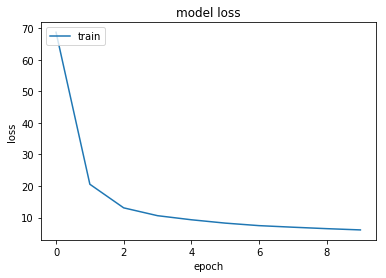

In [0]:
plt.plot(train_hist.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()

**SAVE THE WEIGHTS INTO DRIVE AND BACK**

In [0]:
#save the weights
model_json = model.to_json()
with open("drive/DLSIR_model_weights/model_base.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("drive/DLSIR_model_weights/model_weights_base.h5")
print("Saved model to drive")

Saved model to drive


**EVALUATION HELPER FUNCTIONS**

In [0]:
img_name_test = img_name_test[:5000]
cap_test = cap_test[:5000]


In [0]:

#caching the inception features only for the test dataset
encode_train = sorted(set(img_name_test))

# feel free to change the batch_size according to your system configuration
# a generator which yields 16 images at one shot along with its path
image_dataset = tf.data.Dataset.from_tensor_slices(
                                encode_train).map(load_image_inception).batch(16)

for img, path in image_dataset:
  #image_features_extract_model is the InceptionV3/Resnet stack which gives out tensors in the end 
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features, 
                              (batch_features.shape[0], -1, batch_features.shape[3]))
  

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())
    
'''
remeber to rerun the cell with the training generator after this otherwise metrics will be hard to get
'''

'\nremeber to rerun the cell with the training generator after this otherwise metrics will be hard to get\n'

In [0]:
def t2i(c2i,k):
    """
    Text->Images (Image Search)
    c2i: (N, N) matrix of caption to image errors
    """

    '''
    for Sumanth!:
    
    in our case c2i is the test_errs matrix of size N*N where N is the size of the test datset and each value test_errs[i][j]= the order_violations score
    if N == 1000
    ranks is an numpy.array of size 1000
    
    for each row i in this matrix:(row meaning for one caption all the similarity values with the remiaing 1000 images)
      do an argsort ( sort it but show an array with the indices ka order instead)
      find the rank of this i'th caption among 1000 by searching the index of that i'th column/image ( ideally a rank of 1 means that the model is learing properly cause if the score is 0 that means its a perfect fit!)
    
    recall@k is now that percentage of how many such captions fall below the rank of k .......out of all the images..
    
    
    the function i2tI'llis like take one image and see for all captions!
    '''

    
    
    ranks = np.zeros(c2i.shape[0])

    for i in range(len(ranks)):
        d_i = c2i[i]
        inds = np.argsort(d_i)

        rank = np.where(inds == int(i))[0][0]
        ranks[i] = rank

        def image_dict(k):
            return {'id': k, 'score': float(d_i[k])}

    r10 = 100.0 * len(np.where(ranks < k)[0]) / len(ranks)
    meanr = ranks.mean() + 1

    return map(float, [r10, meanr])




def i2t(c2i,k):
    """
    Image->Texts (Text Search)
    c2i: (N, N) matrix of caption to image errors
    """

    ranks = np.zeros(c2i.shape[1])

    for i in range(len(ranks)):
        d_i = c2i[:, i]
        inds = np.argsort(d_i)

        rank = np.where((inds).astype(int) == i)[0][0]
        ranks[i] = rank

    # Compute metrics
    r10 = 100.0 * len(np.where(ranks < k)[0]) / len(ranks)
    meanr = ranks.mean() + 1
    return map(float, [r10, meanr])

  
def eval_model(k):
  "compute recall@k"
  weights = model.get_weights()


  im_w = weights[7:11] + weights[15:17]
  emb_w = weights[0:7] + weights[11:15]
  
#   print("emb_w : ", len(emb_w))
#   print("im_w : ", len(im_w))x
#   print("im_b : ", len(im_b))
#   print("gru_weights : ", len(gru_weights))

  
#   print(im_w[0])
  
  test_model_im = Model(inputs=image_input, outputs=emb_image)
  test_model_im.set_weights(im_w)
  test_model_im.compile(optimizer='adam', loss="mse")#contrastive_loss)
  test_model_cap = Model(inputs=cap_input, outputs=emb_cap)
  test_model_cap.set_weights(emb_w)
  test_model_cap.compile(optimizer='adam', loss="mse")#contrastive_loss)

  gen = test_generator()

  test_cap = []
  test_im = []
  
  for i in range(len(cap_test)//BATCH_SIZE):
    data = next(gen)
    test_cap.extend(data[0])
    test_im.extend(data[1])


  pred_cap = test_model_cap.predict(np.array(test_cap))
  pred_im = test_model_im.predict(np.array(test_im))
  test_errs = compute_errors(pred_cap, pred_im)
  print("The shape of testerrs is",test_errs.shape)

  r10_c, rmean_c = t2i(test_errs,k)
  r10_i, rmean_i = i2t(test_errs,k)
  return [[r10_c,rmean_c],[r10_i,rmean_i]]

In [0]:
k=10
caption_stats,image_stats = eval_model(k)

Instructions for updating:
Use tf.cast instead.


W0421 19:21:12.277802 140185396995968 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/losses_utils.py:170: to_float (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.


The shape of testerrs is (4992, 4992)


In [0]:
print("caption recall @",k," is=>",caption_stats[0])
print("caption mean @",k," is=>",caption_stats[1])
print("image recall @",k," is=>",image_stats[0])
print("image mean @",k," is=>",image_stats[1])

caption recall @ 10  is=> 9.735576923076923
caption mean @ 10  is=> 175.64042467948718
image recall @ 10  is=> 9.415064102564102
image mean @ 10  is=> 174.0995592948718


In [0]:
# print("caption recall @",k," is=>",caption_stats[0])
# print("caption mean @",k," is=>",caption_stats[1])
# print("image recall @",k," is=>",image_stats[0])
# print("image mean @",k," is=>",image_stats[1])

caption recall @ 10  is=> 20.172275641025642
caption mean @ 10  is=> 78.51502403846153
image recall @ 10  is=> 22.135416666666668
image mean @ 10  is=> 72.20232371794872


testing the model_weights


In [0]:
wts = model.get_weights()
for i in range(len(wts)):
  print(i, end = "\t")
  print(wts[i].shape)

0	(24008, 300)
1	(300, 4096)
2	(1024, 4096)
3	(8192,)
4	(300, 4096)
5	(1024, 4096)
6	(8192,)
7	(2048, 2048)
8	(2048,)
9	(2048, 1024)
10	(1024,)
11	(4096, 2048)
12	(2048,)
13	(2048, 1024)
14	(1024,)
15	(65536, 1024)
16	(1024,)


In [0]:
wts = model.get_weights()
for i in range(len(wts)):
  print(i, end = "\t")
  print(wts[i].shape)

0	(10253, 300)
1	(300, 4096)
2	(1024, 4096)
3	(8192,)
4	(300, 4096)
5	(1024, 4096)
6	(8192,)
7	(4096, 1024)
8	(1024,)
9	(131072, 1024)
10	(1024,)


In [0]:
layer_dict = dict([(layer.name, layer) for layer in model.layers])
# weights = layer_dict['some_name'].get_weights()
layer_dict

{'bidirectional': <tensorflow.python.keras.layers.wrappers.Bidirectional at 0x7f8c7c8da588>,
 'cap_input': <tensorflow.python.keras.engine.input_layer.InputLayer at 0x7f8c7c9545c0>,
 'concatenate_2': <tensorflow.python.keras.layers.merge.Concatenate at 0x7f8c7c8c62e8>,
 'concatenate_3': <tensorflow.python.keras.layers.merge.Concatenate at 0x7f8a67730cf8>,
 'dense': <tensorflow.python.keras.layers.core.Dense at 0x7f8c7c957588>,
 'dense_1': <tensorflow.python.keras.layers.core.Dense at 0x7f8c7c9576d8>,
 'dense_2': <tensorflow.python.keras.layers.core.Dense at 0x7f8c7c957d68>,
 'dense_3': <tensorflow.python.keras.layers.core.Dense at 0x7f8c7c8da908>,
 'dense_4': <tensorflow.python.keras.layers.core.Dense at 0x7f8c7c873828>,
 'embedding': <tensorflow.python.keras.layers.embeddings.Embedding at 0x7f8c7c917cf8>,
 'flatten': <tensorflow.python.keras.layers.core.Flatten at 0x7f8c7c957a20>,
 'image_input': <tensorflow.python.keras.engine.input_layer.InputLayer at 0x7f8c7c957518>,
 'lambda': <te

In [0]:
for layer in model.layers:
  print("\t", layer.name)
  for j in layer_dict[layer.name].get_weights():
    print('\t\t', j.shape)

	 cap_input
	 masking
	 embedding
		 (24008, 300)
	 image_input
	 bidirectional
		 (300, 4096)
		 (1024, 4096)
		 (8192,)
		 (300, 4096)
		 (1024, 4096)
		 (8192,)
	 dense
		 (2048, 2048)
		 (2048,)
	 concatenate_2
	 dense_1
		 (2048, 1024)
		 (1024,)
	 dense_3
		 (4096, 2048)
		 (2048,)
	 flatten
	 dense_4
		 (2048, 1024)
		 (1024,)
	 dense_2
		 (65536, 1024)
		 (1024,)
	 lambda_1
	 lambda
	 concatenate_3


In [0]:
layer_dict['image_input']

In [0]:
def get_test_models_from_weights():
  weights = model.get_weights()

  im_w = weights[7:11] + weights[15:17]
  emb_w = weights[0:7] + weights[11:15]
  
#   print("emb_w : ", len(emb_w))
#   print("im_w : ", len(im_w))x
#   print("im_b : ", len(im_b))
#   print("gru_weights : ", len(gru_weights))

  
#   print(im_w[0])
  
  test_model_im = Model(inputs=image_input, outputs=emb_image)
  test_model_im.set_weights(im_w)
  test_model_im.compile(optimizer='adam', loss="mse")#contrastive_loss)
  test_model_cap = Model(inputs=cap_input, outputs=emb_cap)
  test_model_cap.set_weights(emb_w)
  test_model_cap.compile(optimizer='adam', loss="mse")#contrastive_loss)
  return test_model_cap,test_model_im



In [0]:

test_model_cap , test_model_im = get_test_models_from_weights()
# pred_cap = test_model_cap.predict(np.array([test_c]))
# pred_im = test_model_im.predict(np.array([test_i]))
# order_violations(pred_cap, pred_im)

Instructions for updating:
Use tf.cast instead.


W0421 13:34:22.509632 140244789606272 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/losses_utils.py:170: to_float (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.


In [0]:
def gimme_image(number):
#   im = Image.open(img_name_val[number])
  test_i = mpimg.imread(img_name_test[number])
  plt.imshow(test_i)
  
  return np.array([np.load(img_name_test[number] +'.npy')])

In [0]:
def gimme_caption(number):
  test_c = cap_test[number]
  word_map = dict(map(reversed, tokenizer.word_index.items()))
  s = ' '.join([ word_map[i] for i in test_c ])
  print("caption:",s)
#   print(test_c)
  return np.array([test_c])



In [0]:
# TODO: rewrite ( use tokenizer )
def caption_to_post_padding(caption):
  caption = '<start> ' + caption + ' <end>'
  tokens = caption.split()
  pad_amount = max_length-len(tokens)
  padding = ['<pad>']*pad_amount
  tokens.extend(padding)
  return tokens

def caption_to_embedding(caption):
  def get_word_index(x):
    try:
      return tokenizer.word_index[x]
    except:
      return 0#out of vocabulary have to look into this later
  
  tokens = caption_to_post_padding(caption)
  index = list(map(lambda x:get_word_index(x),tokens))
  return np.array(index)
   
a = caption_to_embedding("white toilet in a red boat")
print(a.shape)

(52,)


In [0]:
def query(cap,img):
  return order_violations(test_model_cap.predict(cap), test_model_im.predict(img))

caption: <start> a living room with a white couch and chair <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


0.029753005974498592

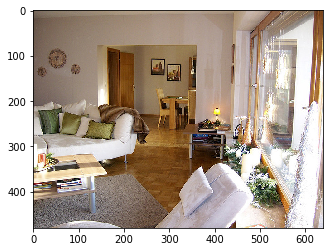

In [0]:
query(gimme_caption(25),gimme_image(25) )

**  RETRIEVE THE TOP 5 IMAGES GIVEN A CAPTION**

In [0]:
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

def show_top_images_with_scores(combined):
#   fig = plt.figure()
  fig, ax = plt.subplots(len(combined),1, figsize=(15, 15))
  i=0
  for score,img_path in combined:
    print("-"*100)
    print("IMAGE IS ...",img_path)
    img = Image.open(img_path)
    
    ax[i].imshow(img)
    print("SCORE IS ...", end = " ")
    print(score)
    i+=1



In [0]:
# getting the unique images
encode_train = sorted(set(img_name_test[0:5000]))

# feel free to change the batch_size according to your system configuration
# a generator which yields 16 images at one shot along with its path
image_dataset = tf.data.Dataset.from_tensor_slices(
                                encode_train).map(load_image_inception).batch(16)

for img, path in image_dataset:
  #image_features_extract_model is the InceptionV3/Resnet stack which gives out tensors in the end 
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features, 
                              (batch_features.shape[0], -1, batch_features.shape[3]))
  

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())
  


In [0]:
#caching the test dataset ka image embeddings
all_test_images = img_name_test[:5000]
all_test_image_features = list(map(lambda img_name:np.load(img_name +'.npy'), all_test_images))
imgs_embs = test_model_im.predict(np.array(all_test_image_features))

In [0]:
'''
1. prepare caption by making it an embedding
2. take the test dataset ka images which has been pased thru the cnn stack and make 2 lists of -1.with all the features -2.with all the corresponding image_names
3. take the test_models and predict for this caption and all images and get a list of similarity scores.
4. zip the list with the similarity scores and the images_names and sort based on the score using "key"
5.pick top k and show as an image
'''
def get_top_k_images(k,caption):
  cap_inp = caption_to_embedding(caption)
  test_model_cap , test_model_im = get_test_models_from_weights()
  #this might fail if so wrap it around a np.array
#   print(cap_inp.shape)
#   print(cap_inp)
#   return 
  cap_emb = test_model_cap.predict(np.array([cap_inp]))
  print("cap_emb is ",cap_emb.shape)
  #refer the above cell
#   all_test_images = img_name_val
#   all_test_image_features = list(map(lambda img_name:np.load(img_name +'.npy'), all_test_images))
#   imgs_embs = test_model_im.predict(np.array(all_test_image_features))


  print("imgs_embs are",imgs_embs.shape)
  similarity_scores = []
  for img_emb in imgs_embs:
    score=order_violations(cap_emb,img_emb)
    similarity_scores.append(score)
  combined = list(zip(similarity_scores,all_test_images))
  topk= sorted(combined, key=lambda x: x[0])[:k]
  print(topk)
  show_top_images_with_scores(topk)
  return 

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.0005377631028431612, '/content/train2014/COCO_train2014_000000238963.jpg'), (0.0006180855524143582, '/content/train2014/COCO_train2014_000000022799.jpg'), (0.0007755964695932982, '/content/train2014/COCO_train2014_000000223718.jpg'), (0.0014512055534093293, '/content/train2014/COCO_train2014_000000042418.jpg'), (0.0016400903885750578, '/content/train2014/COCO_train2014_000000118745.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000238963.jpg
SCORE IS ... 0.0005377631028431612
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000022799.jpg
SCORE IS ... 0.0006180855524143582
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_0000002

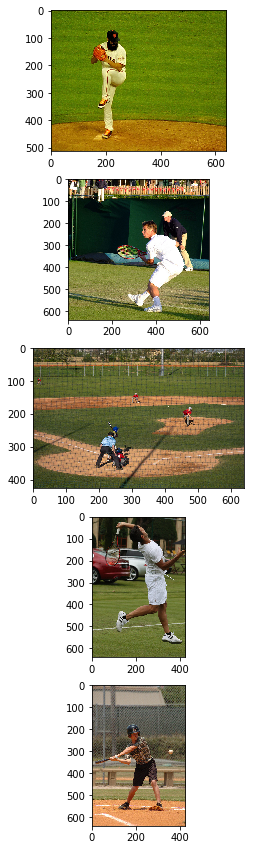

In [0]:
caption = "man playing baseball"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.013784972607704171, '/content/train2014/COCO_train2014_000000524557.jpg'), (0.013973842556201321, '/content/train2014/COCO_train2014_000000380351.jpg'), (0.016572751608496583, '/content/train2014/COCO_train2014_000000151353.jpg'), (0.016974894322495437, '/content/train2014/COCO_train2014_000000066944.jpg'), (0.016981293907059047, '/content/train2014/COCO_train2014_000000115992.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000524557.jpg
SCORE IS ... 0.013784972607704171
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000380351.jpg
SCORE IS ... 0.013973842556201321
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000151353.j

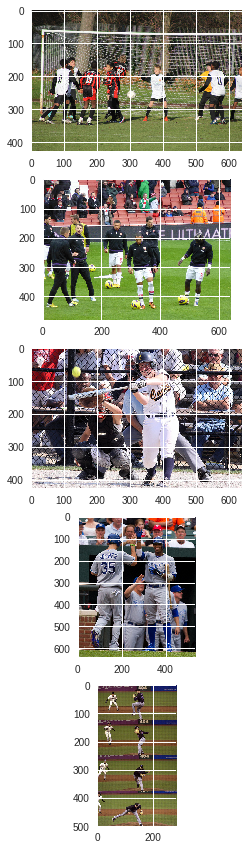

In [0]:
caption = "man playing baseball"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (3200, 1024)
[(0.006681813612578802, '/content/train2014/COCO_train2014_000000457725.jpg'), (0.008642640720883998, '/content/train2014/COCO_train2014_000000266114.jpg'), (0.008642640720883998, '/content/train2014/COCO_train2014_000000266114.jpg'), (0.009284136441746471, '/content/train2014/COCO_train2014_000000227552.jpg'), (0.009524743066502472, '/content/train2014/COCO_train2014_000000470292.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000457725.jpg
SCORE IS ... 0.006681813612578802
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000266114.jpg
SCORE IS ... 0.008642640720883998
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000266114.j

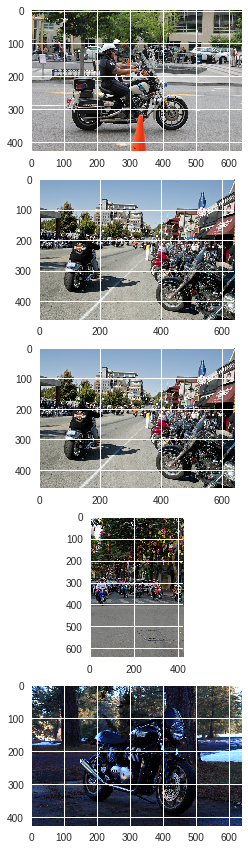

In [0]:
"caption = "man riding bike"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.012255607618549824, '/content/train2014/COCO_train2014_000000299026.jpg'), (0.014903100299632266, '/content/train2014/COCO_train2014_000000165334.jpg'), (0.015566792633146476, '/content/train2014/COCO_train2014_000000249288.jpg'), (0.01575109741909686, '/content/train2014/COCO_train2014_000000277470.jpg'), (0.016034140053705848, '/content/train2014/COCO_train2014_000000385145.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000299026.jpg
SCORE IS ... 0.012255607618549824
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000165334.jpg
SCORE IS ... 0.014903100299632266
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000249288.jp

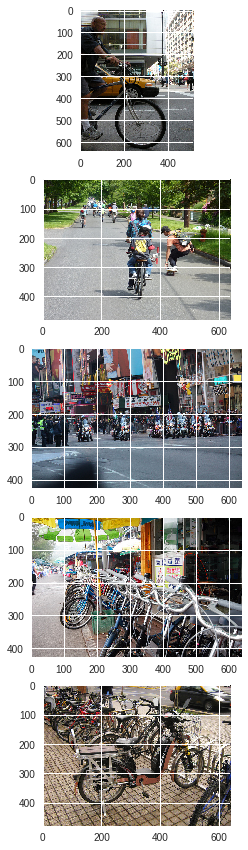

In [0]:
caption = "man riding bike"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (3200, 1024)
[(0.015014124533653528, '/content/train2014/COCO_train2014_000000312661.jpg'), (0.017642908695913784, '/content/train2014/COCO_train2014_000000428440.jpg'), (0.01785385677448037, '/content/train2014/COCO_train2014_000000417962.jpg'), (0.018757776233885304, '/content/train2014/COCO_train2014_000000324663.jpg'), (0.021328184303478714, '/content/train2014/COCO_train2014_000000357210.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000312661.jpg
SCORE IS ... 0.015014124533653528
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000428440.jpg
SCORE IS ... 0.017642908695913784
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000417962.jp

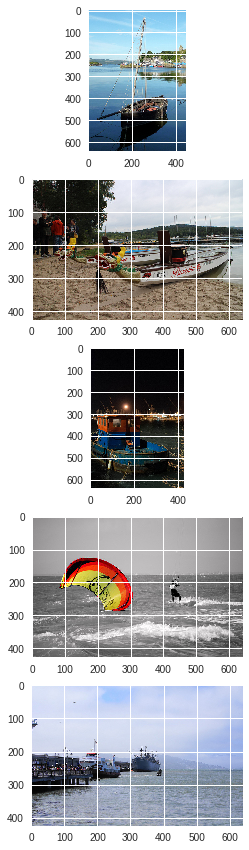

In [0]:
caption = "boats in river"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.006654074436980795, '/content/train2014/COCO_train2014_000000316759.jpg'), (0.00782085889707762, '/content/train2014/COCO_train2014_000000534443.jpg'), (0.009311519886201991, '/content/train2014/COCO_train2014_000000225325.jpg'), (0.009318723748549473, '/content/train2014/COCO_train2014_000000312661.jpg'), (0.010286971588115756, '/content/train2014/COCO_train2014_000000142466.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000316759.jpg
SCORE IS ... 0.006654074436980795
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000534443.jpg
SCORE IS ... 0.00782085889707762
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000225325.jpg

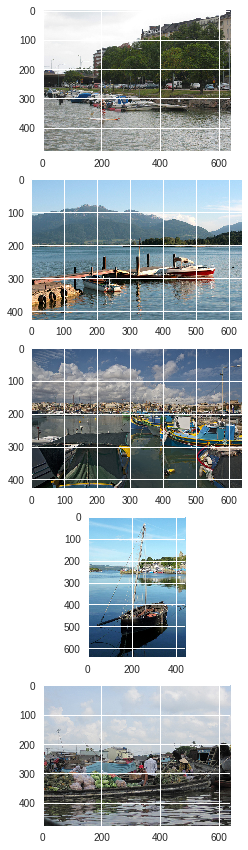

In [0]:
caption = "boats in river"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (3200, 1024)
[(0.013011102732145619, '/content/train2014/COCO_train2014_000000534543.jpg'), (0.013600161076722517, '/content/train2014/COCO_train2014_000000196851.jpg'), (0.014610191285457985, '/content/train2014/COCO_train2014_000000289147.jpg'), (0.015065775300304785, '/content/train2014/COCO_train2014_000000145351.jpg'), (0.016663438460825297, '/content/train2014/COCO_train2014_000000198793.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000534543.jpg
SCORE IS ... 0.013011102732145619
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000196851.jpg
SCORE IS ... 0.013600161076722517
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000289147.j

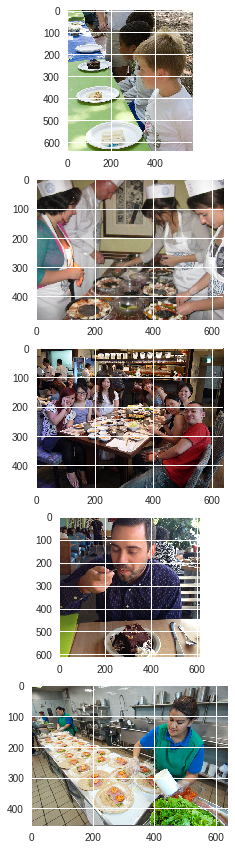

In [0]:
caption = "a man holding a plate of food that has been shaped into a heart"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.009240718785102908, '/content/train2014/COCO_train2014_000000041940.jpg'), (0.00980545259811777, '/content/train2014/COCO_train2014_000000240331.jpg'), (0.011071735488976664, '/content/train2014/COCO_train2014_000000397104.jpg'), (0.01138113551007458, '/content/train2014/COCO_train2014_000000516990.jpg'), (0.01204995015388377, '/content/train2014/COCO_train2014_000000552265.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000041940.jpg
SCORE IS ... 0.009240718785102908
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000240331.jpg
SCORE IS ... 0.00980545259811777
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000397104.jpg
S

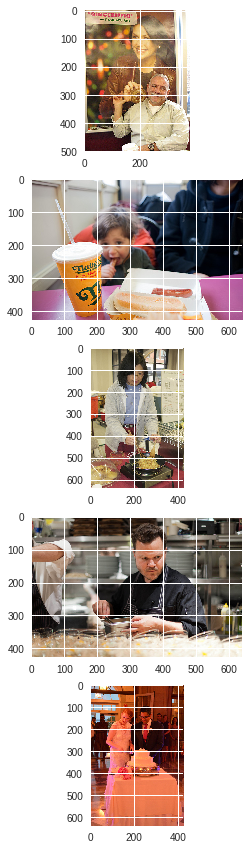

In [0]:
caption = "a man holding a plate of food that has been shaped into a heart"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (3200, 1024)
[(0.005323864561511904, '/content/train2014/COCO_train2014_000000556622.jpg'), (0.006522536568480897, '/content/train2014/COCO_train2014_000000182291.jpg'), (0.00830468972897963, '/content/train2014/COCO_train2014_000000224874.jpg'), (0.00837254844687113, '/content/train2014/COCO_train2014_000000043308.jpg'), (0.008523022777545686, '/content/train2014/COCO_train2014_000000521201.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000556622.jpg
SCORE IS ... 0.005323864561511904
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000182291.jpg
SCORE IS ... 0.006522536568480897
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000224874.jpg

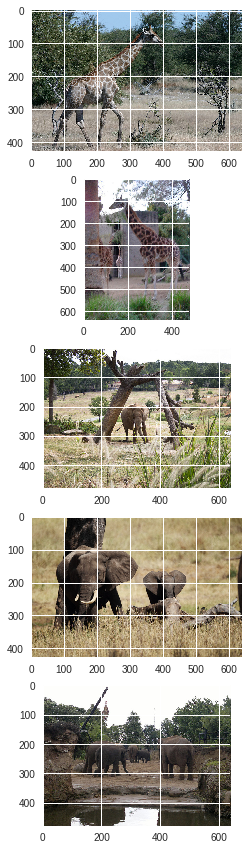

In [0]:
caption = "a herd of elephants roaming in the green forest"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.008797495319390836, '/content/train2014/COCO_train2014_000000010495.jpg'), (0.010912931624290856, '/content/train2014/COCO_train2014_000000552681.jpg'), (0.010917690820504478, '/content/train2014/COCO_train2014_000000130970.jpg'), (0.012714636117521716, '/content/train2014/COCO_train2014_000000308603.jpg'), (0.013264922237805843, '/content/train2014/COCO_train2014_000000274467.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000010495.jpg
SCORE IS ... 0.008797495319390836
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000552681.jpg
SCORE IS ... 0.010912931624290856
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000130970.j

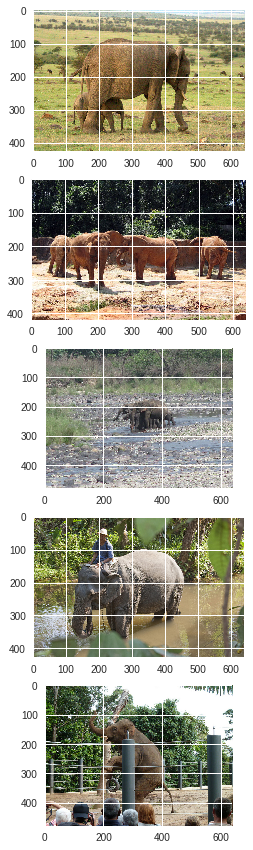

In [0]:
caption = "a herd of elephants roaming in the green forest"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (3200, 1024)
[(0.0049492607033685965, '/content/train2014/COCO_train2014_000000039531.jpg'), (0.007173176801451797, '/content/train2014/COCO_train2014_000000530040.jpg'), (0.009263453934650556, '/content/train2014/COCO_train2014_000000374922.jpg'), (0.010019063489608016, '/content/train2014/COCO_train2014_000000520091.jpg'), (0.010079848981242812, '/content/train2014/COCO_train2014_000000401292.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000039531.jpg
SCORE IS ... 0.0049492607033685965
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000530040.jpg
SCORE IS ... 0.007173176801451797
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000374922

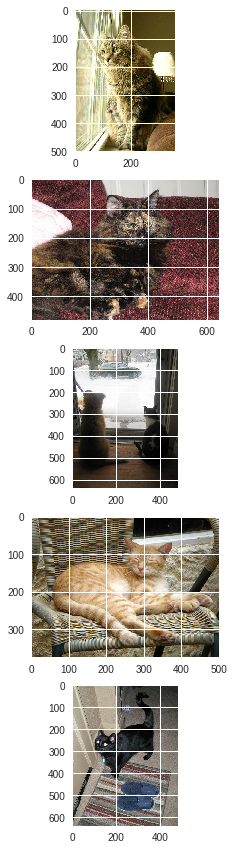

In [0]:
caption = "cat"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.010987005531051752, '/content/train2014/COCO_train2014_000000142649.jpg'), (0.011227817715697919, '/content/train2014/COCO_train2014_000000549821.jpg'), (0.011897357767853833, '/content/train2014/COCO_train2014_000000429638.jpg'), (0.011897357767853833, '/content/train2014/COCO_train2014_000000429638.jpg'), (0.012171466148302779, '/content/train2014/COCO_train2014_000000217928.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000142649.jpg
SCORE IS ... 0.010987005531051752
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000549821.jpg
SCORE IS ... 0.011227817715697919
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000429638.j

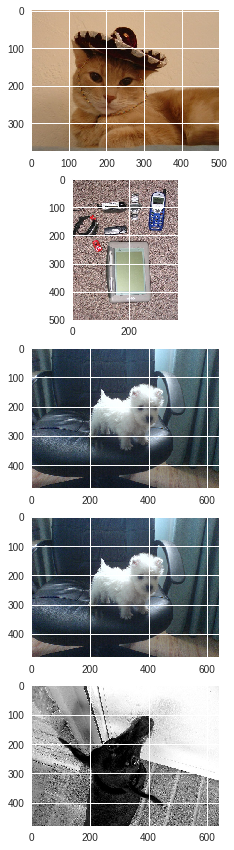

In [0]:
caption = "cat"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.010012248330421025, '/content/train2014/COCO_train2014_000000132104.jpg'), (0.014005297394015237, '/content/train2014/COCO_train2014_000000408431.jpg'), (0.015042170217762996, '/content/train2014/COCO_train2014_000000371376.jpg'), (0.015491930316740232, '/content/train2014/COCO_train2014_000000474401.jpg'), (0.016051575735037682, '/content/train2014/COCO_train2014_000000029891.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000132104.jpg
SCORE IS ... 0.010012248330421025
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000408431.jpg
SCORE IS ... 0.014005297394015237
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000371376.j

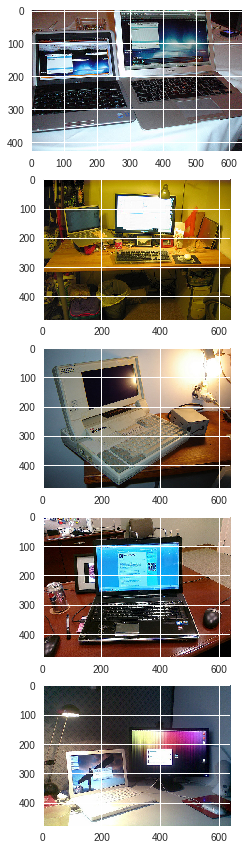

In [0]:
caption = "a laptop computer sitting on top of a table"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.014005463160000398, '/content/train2014/COCO_train2014_000000002209.jpg'), (0.016578672023172203, '/content/train2014/COCO_train2014_000000534965.jpg'), (0.017454024507479682, '/content/train2014/COCO_train2014_000000028876.jpg'), (0.017508322589252723, '/content/train2014/COCO_train2014_000000222107.jpg'), (0.018740339195947087, '/content/train2014/COCO_train2014_000000399878.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000002209.jpg
SCORE IS ... 0.014005463160000398
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000534965.jpg
SCORE IS ... 0.016578672023172203
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000028876.j

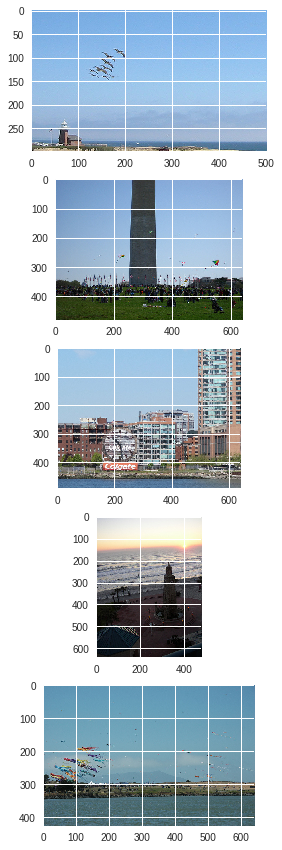

In [0]:
caption = "birds flying"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.015889559288979394, '/content/train2014/COCO_train2014_000000309195.jpg'), (0.015953460939499564, '/content/train2014/COCO_train2014_000000527314.jpg'), (0.016248088454645426, '/content/train2014/COCO_train2014_000000335703.jpg'), (0.01650470646094271, '/content/train2014/COCO_train2014_000000478577.jpg'), (0.017190194867055197, '/content/train2014/COCO_train2014_000000365831.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000309195.jpg
SCORE IS ... 0.015889559288979394
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000527314.jpg
SCORE IS ... 0.015953460939499564
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000335703.jp

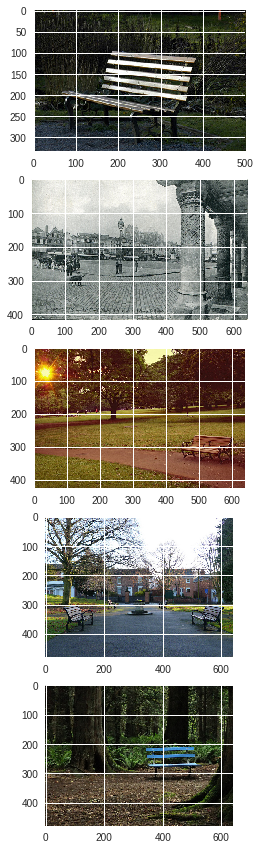

In [0]:
caption = "bench in the park"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.00587968713382564, '/content/train2014/COCO_train2014_000000219964.jpg'), (0.007884883930053599, '/content/train2014/COCO_train2014_000000095916.jpg'), (0.008340350871606006, '/content/train2014/COCO_train2014_000000101906.jpg'), (0.00848122189059769, '/content/train2014/COCO_train2014_000000490985.jpg'), (0.008507483324742326, '/content/train2014/COCO_train2014_000000044353.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000219964.jpg
SCORE IS ... 0.00587968713382564
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000095916.jpg
SCORE IS ... 0.007884883930053599
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000101906.jpg


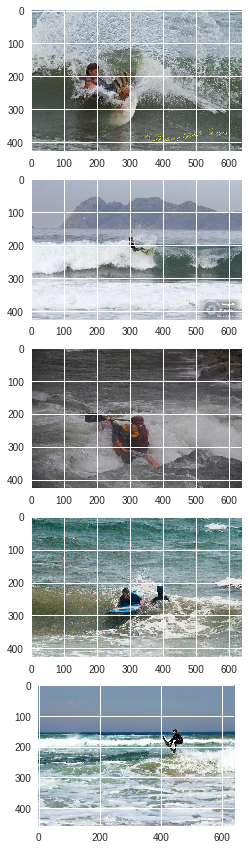

In [0]:
caption = "several people on a beach one is parasailing one has been wind surfing and some are gathering up a picnic"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.009414058733623387, '/content/train2014/COCO_train2014_000000463482.jpg'), (0.012073269001360798, '/content/train2014/COCO_train2014_000000191417.jpg'), (0.012089873818090846, '/content/train2014/COCO_train2014_000000543588.jpg'), (0.013390686478022273, '/content/train2014/COCO_train2014_000000264170.jpg'), (0.01393718905986946, '/content/train2014/COCO_train2014_000000556185.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000463482.jpg
SCORE IS ... 0.009414058733623387
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000191417.jpg
SCORE IS ... 0.012073269001360798
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000543588.jp

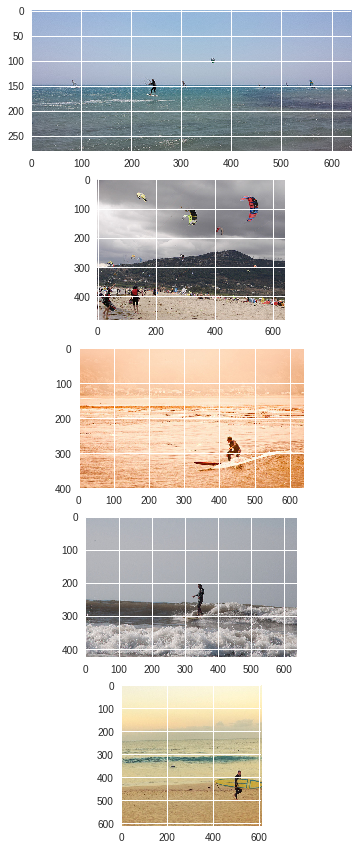

In [0]:
caption = "surfing waves beach"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.016121364015489803, '/content/train2014/COCO_train2014_000000062589.jpg'), (0.01785772762084381, '/content/train2014/COCO_train2014_000000256451.jpg'), (0.01791000517003405, '/content/train2014/COCO_train2014_000000345981.jpg'), (0.018224715794240787, '/content/train2014/COCO_train2014_000000282129.jpg'), (0.01867897221302517, '/content/train2014/COCO_train2014_000000012313.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000062589.jpg
SCORE IS ... 0.016121364015489803
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000256451.jpg
SCORE IS ... 0.01785772762084381
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000345981.jpg
S

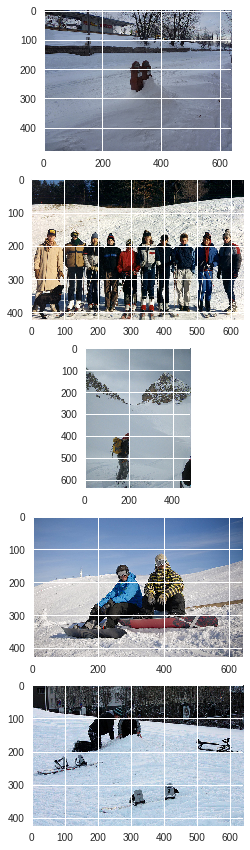

In [0]:
caption = "man on top of mountain"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.01512450154107925, '/content/train2014/COCO_train2014_000000060046.jpg'), (0.015817193990522505, '/content/train2014/COCO_train2014_000000351439.jpg'), (0.016259581983934845, '/content/train2014/COCO_train2014_000000090061.jpg'), (0.016506996117035877, '/content/train2014/COCO_train2014_000000152566.jpg'), (0.016819957699315324, '/content/train2014/COCO_train2014_000000437797.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000060046.jpg
SCORE IS ... 0.01512450154107925
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000351439.jpg
SCORE IS ... 0.015817193990522505
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000090061.jpg

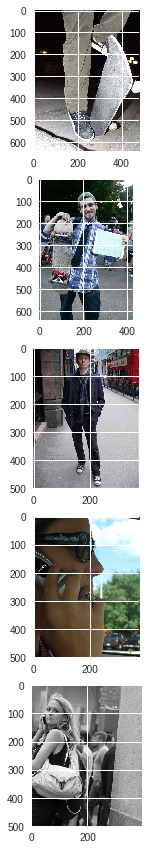

In [0]:
caption = "guy speaking on his phone"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.0090524324659782, '/content/train2014/COCO_train2014_000000370417.jpg'), (0.00933337736114398, '/content/train2014/COCO_train2014_000000465174.jpg'), (0.009508295044008186, '/content/train2014/COCO_train2014_000000178418.jpg'), (0.010310433482712045, '/content/train2014/COCO_train2014_000000352938.jpg'), (0.010710223787227025, '/content/train2014/COCO_train2014_000000472103.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000370417.jpg
SCORE IS ... 0.0090524324659782
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000465174.jpg
SCORE IS ... 0.00933337736114398
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000178418.jpg
SCO

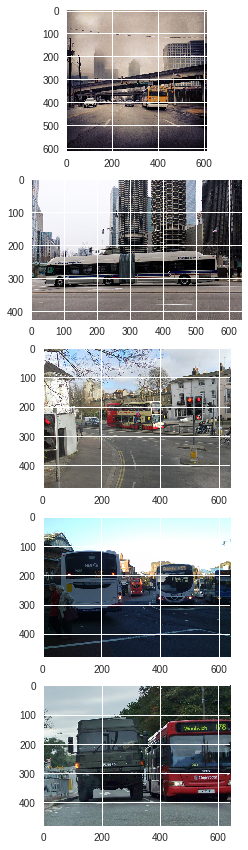

In [0]:
caption = "bus moving on the road"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.013692734387419137, '/content/train2014/COCO_train2014_000000067798.jpg'), (0.014468760099263511, '/content/train2014/COCO_train2014_000000082597.jpg'), (0.014879657588633188, '/content/train2014/COCO_train2014_000000475523.jpg'), (0.01695754229837121, '/content/train2014/COCO_train2014_000000481120.jpg'), (0.017161038322708544, '/content/train2014/COCO_train2014_000000365855.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000067798.jpg
SCORE IS ... 0.013692734387419137
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000082597.jpg
SCORE IS ... 0.014468760099263511
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000475523.jp

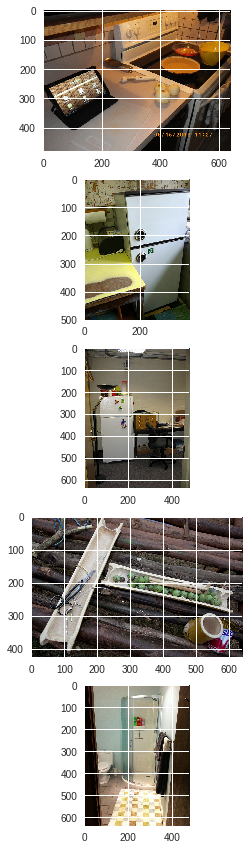

In [0]:
caption = "oven"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.00568794596256339, '/content/train2014/COCO_train2014_000000098495.jpg'), (0.006902420298709411, '/content/train2014/COCO_train2014_000000235838.jpg'), (0.007225893131676209, '/content/train2014/COCO_train2014_000000057689.jpg'), (0.007279511867924526, '/content/train2014/COCO_train2014_000000436438.jpg'), (0.007487533731954876, '/content/train2014/COCO_train2014_000000234000.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000098495.jpg
SCORE IS ... 0.00568794596256339
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000235838.jpg
SCORE IS ... 0.006902420298709411
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000057689.jpg

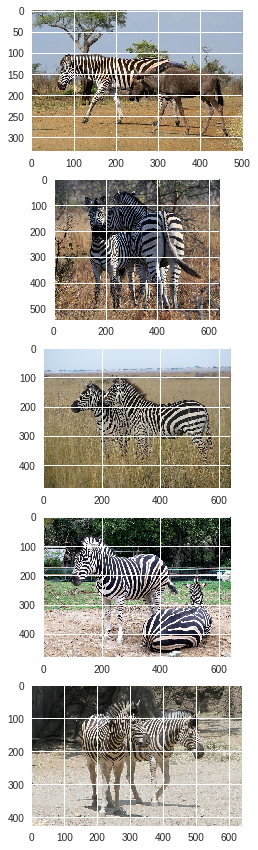

In [0]:
caption = "group of zebras"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.016204415960615393, '/content/train2014/COCO_train2014_000000336286.jpg'), (0.018066094525480914, '/content/train2014/COCO_train2014_000000127843.jpg'), (0.020036513450571114, '/content/train2014/COCO_train2014_000000580296.jpg'), (0.02343890242361013, '/content/train2014/COCO_train2014_000000279076.jpg'), (0.02411393128457817, '/content/train2014/COCO_train2014_000000039470.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000336286.jpg
SCORE IS ... 0.016204415960615393
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000127843.jpg
SCORE IS ... 0.018066094525480914
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000580296.jpg

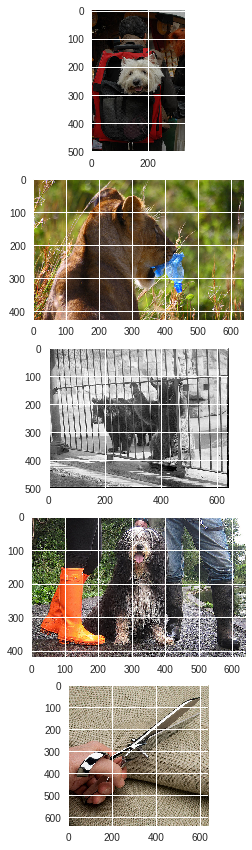

In [0]:
caption = "sleeping guy"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.00964804475419001, '/content/train2014/COCO_train2014_000000266369.jpg'), (0.01144107087293783, '/content/train2014/COCO_train2014_000000090061.jpg'), (0.014109812821588241, '/content/train2014/COCO_train2014_000000333537.jpg'), (0.016219761449494996, '/content/train2014/COCO_train2014_000000274605.jpg'), (0.017683768639926933, '/content/train2014/COCO_train2014_000000108540.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000266369.jpg
SCORE IS ... 0.00964804475419001
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000090061.jpg
SCORE IS ... 0.01144107087293783
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000333537.jpg
S

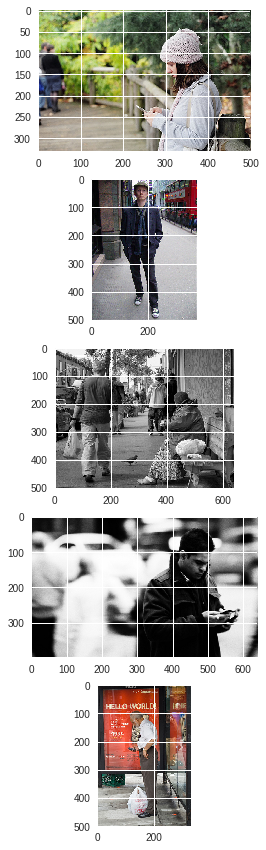

In [0]:
caption = "children on a picnic"
get_top_k_images(5,caption)

TESTTTTT

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.0036941123901099854, '/content/train2014/COCO_train2014_000000015073.jpg'), (0.0037512897548480084, '/content/train2014/COCO_train2014_000000376029.jpg'), (0.004082075247438033, '/content/train2014/COCO_train2014_000000247320.jpg'), (0.0041821949561102745, '/content/train2014/COCO_train2014_000000091397.jpg'), (0.0042622612218237155, '/content/train2014/COCO_train2014_000000472089.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000015073.jpg
SCORE IS ... 0.0036941123901099854
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000376029.jpg
SCORE IS ... 0.0037512897548480084
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_00000024

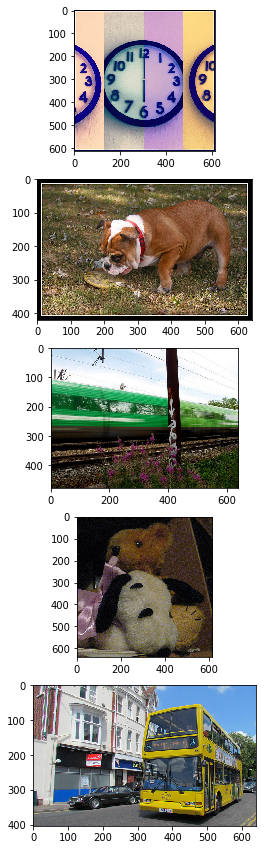

In [0]:
caption = "man playing baseball"
get_top_k_images(5,caption)

cap_emb is  (1, 1024)
imgs_embs are (5000, 1024)
[(0.0037019787885124306, '/content/train2014/COCO_train2014_000000015073.jpg'), (0.0037246559529139495, '/content/train2014/COCO_train2014_000000376029.jpg'), (0.004105771835329064, '/content/train2014/COCO_train2014_000000247320.jpg'), (0.004167279312589978, '/content/train2014/COCO_train2014_000000091397.jpg'), (0.004280788565838245, '/content/train2014/COCO_train2014_000000472089.jpg')]
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000015073.jpg
SCORE IS ... 0.0037019787885124306
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_000000376029.jpg
SCORE IS ... 0.0037246559529139495
----------------------------------------------------------------------------------------------------
IMAGE IS ... /content/train2014/COCO_train2014_0000002473

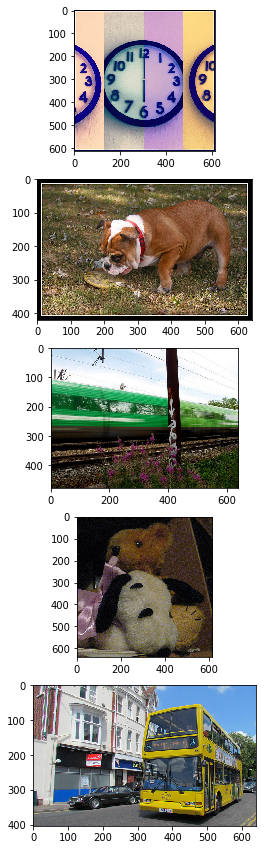

In [0]:
caption = "cars on the road"
get_top_k_images(5,caption)